In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))

In [2]:
import sys
import os
import struct
import time
import numpy as np
import h5py
from glob import glob
import scipy.io as sio
from scipy import ndimage as nd
from scipy import misc
from scipy.io import loadmat
from tqdm import tqdm
import multiprocessing as mp
import pickle
import math
import matplotlib.pyplot as plt
import PIL.Image as pim
import PIL.ImageOps as pop
import seaborn as sns
%matplotlib inline

from src.config import *

In [3]:
from src.numpy_utility import mosaic_vis, iterate_minibatches
from src.file_utility import save_stuff

In [4]:
def applyCropToImg(img, box):
    '''
    applyCropToImg(img, cropBox)
    img ~ any h x w x n image
    cropBox ~ (top, bottom, left, right) in fractions of image size
    '''
    if box[0]+box[1] >= 1:
        raise ValueError('top and bottom crop must sum to less than 1')
    if box[2]+box[3] >= 1:
        raise ValueError('left and right crop must sum to less than 1')
    shape = img.shape
    topCrop = np.round(shape[0]*box[0]).astype(int)
    bottomCrop = np.round(shape[0]*box[1]).astype(int)
    leftCrop = np.round(shape[1]*box[2]).astype(int)
    rightCrop = np.round(shape[1]*box[3]).astype(int)
    croppedImage = img[topCrop:(shape[0]-bottomCrop),leftCrop:(shape[1]-rightCrop)]
    return croppedImage
def closest_neighbor_resize(img, newsize=(100,100)):
    sample_x = np.linspace(0, img.shape[0]-1, newsize[0]).round(0).astype(int)
    sample_y = np.linspace(0, img.shape[1]-1, newsize[1]).round(0).astype(int)
    return img[sample_x][:,sample_y]

def maskToIndices(img):
    return img[:,:,0]+img[:,:,1]*256+img[:,:,2]*(256**2)
def maskToUniqueIndices(img):
    imgSegIds = list(np.unique(maskToIndices(img)))
    if 0 in imgSegIds:
        imgSegIds.remove(0)
    return np.unique(imgSegIds)

In [ ]:
def getCategoryNames(catIdToCat, catIds):
    # getCategoryNames(catToCat, catIds)
    return [catIdToCat[c][0]['name'] for c in catIds]
def getSupercategoryNames(catIdToCat, catIds):
    # getSupercategoryNames(catToCat, catIds)
    return [catIdToCat[c][0]['supercategory'] for c in catIds]
def getCategoryIDs(annotations, imgSegIds):
    segToCatId = defaultdict(list)
    for ann in annotations:
        for seg in ann['segments_info']:
            segToCatId[seg['id']] = seg['category_id']
    return [segToCatId[s] for s in imgSegIds] #  if s in segToCatId

## Load a dataset

In [5]:
nsd_root   = '/export/raid1/home/surly/raid4/kendrick-data/nsd/'
stim_root  = nsd_root + "nsddata_stimuli/stimuli/nsd/"
synth_root = nsd_root + "nsddata_stimuli/stimuli/nsdsynthetic/"
beta_root  = nsd_root + "nsddata_betas/ppdata/"

synth_design_file = nsd_root + "nsddata/experiments/nsdsynthetic/nsdsynthetic_expdesign.mat"
stim_file       = stim_root + "nsd_stimuli.hdf5"
synth_file      = synth_root + "nsdsynthetic_stimuli.hdf5"

In [6]:
exp_design = loadmat(exp_design_file)

In [7]:
print (exp_design.keys())

dict_keys(['__header__', '__version__', '__globals__', 'basiccnt', 'masterordering', 'sharedix', 'stimpattern', 'subjectim'])


In [8]:
basic_cnt    = exp_design['basiccnt']
shared_idx   = exp_design['sharedix']
subject_idx  = exp_design['subjectim']
trial_order  = exp_design['masterordering']
stim_pattern = exp_design['stimpattern']

In [9]:
print (np.min(trial_order), np.max(trial_order))

1 10000


In [151]:
print ("Loading block...")
image_data_set = h5py.File(stim_file, 'r')
print (image_data_set.keys())
image_data = np.copy(image_data_set['imgBrick'])
image_data_set.close()
print (image_data.shape)

Loading block...
<KeysViewHDF5 ['imgBrick']>
(73000, 425, 425, 3)


In [11]:
print (shared_idx.shape)
print (np.min(shared_idx), np.max(shared_idx))

(1, 1000)
2951 72949


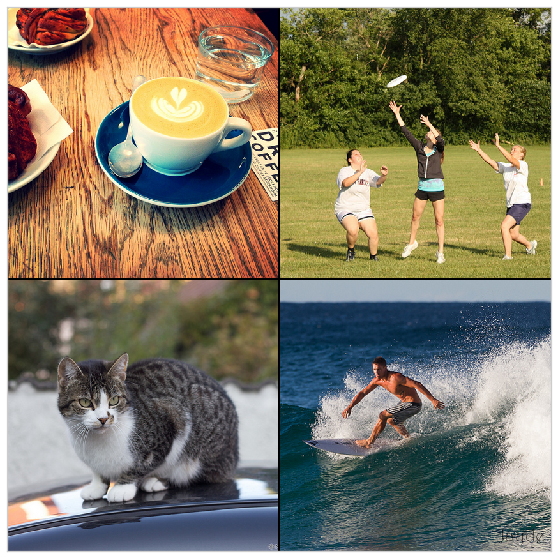

In [12]:
plt.figure(figsize=(10,10))
plt.imshow(mosaic_vis(image_data[shared_idx[0,6:10]-1].astype(np.float32), pad=2), cmap='gray', interpolation='None')
plt.gca().get_xaxis().set_visible(False)
plt.gca().get_yaxis().set_visible(False)

---

# Subject-wise image block
## Native resolution

In [13]:
for k,s_idx in enumerate(subject_idx):
    s_image_data = image_data[s_idx - 1].transpose(0,3,1,2)
    print (s_image_data.shape)
    save_stuff("%sS%d_stimuli_native"%(stim_dir, k+1), {'stimuli': s_image_data})

(10000, 3, 425, 425)


OSError: Unable to create file (unable to open file: name = '/export/raid1/home/surly/raid4/kendrick-data/nsd/nsddata_stimuli/stimuli/nsd/S1_stimuli_native.h5py', errno = 13, error message = 'Permission denied', flags = 13, o_flags = 242)

## Downsampled resolution

In [ ]:
def resize_image_tensor(x, newsize):
    tt = x.transpose((0,2,3,1))
    r  = np.ndarray(shape=x.shape[:1]+newsize+(x.shape[1],), dtype=tt.dtype) 
    for i,t in enumerate(tt):
        r[i] = np.asarray(pim.fromarray(t).resize(newsize, resample=pim.BILINEAR))
    return r.transpose((0,3,1,2))   

In [17]:
nx = 227
for k,s_idx in enumerate(subject_idx):
    s_image_data = image_data[s_idx - 1]
    s_image_data = resize_image_tensor(s_image_data.transpose(0,3,1,2), newsize=(nx,nx))

    print (s_image_data.shape)
    save_stuff("%sS%d_stimuli_%d"%(stim_root, k+1, nx), {'stimuli': s_image_data})

(10000, 3, 227, 227)
saved stimuli in h5py file
(10000, 3, 227, 227)
saved stimuli in h5py file
(10000, 3, 227, 227)
saved stimuli in h5py file
(10000, 3, 227, 227)
saved stimuli in h5py file
(10000, 3, 227, 227)
saved stimuli in h5py file
(10000, 3, 227, 227)
saved stimuli in h5py file
(10000, 3, 227, 227)
saved stimuli in h5py file
(10000, 3, 227, 227)
saved stimuli in h5py file


# NSD Synthetic images

In [32]:
exp_design = loadmat(synth_design_file)

In [33]:
print (exp_design.keys())

['masterordering', 'stimpattern', '__version__', '__header__', '__globals__']


In [34]:
trial_order  = exp_design['masterordering']
stim_pattern = exp_design['stimpattern']

In [41]:
print ("Loading block...")
image_data_set = h5py.File(synth_file, 'r')
print (image_data_set.keys())
image_data = np.copy(image_data_set['imgBrick'])
image_data_set.close()
print image_data.shape

Loading block...
[u'imgBrick']
(220, 714, 1360, 3)


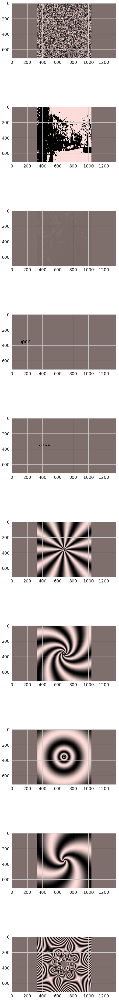

In [63]:
n_examples=10
plt.figure(figsize=(8,8*n_examples))
for k, n in enumerate(np.arange(0, len(image_data), len(image_data)/10)):
    plt.subplot(n_examples,1,k+1)
    plt.imshow(image_data[n])

# Crop and downsample to Alexnet/Gnet input resolution

In [28]:
def resize_image_tensor(x, newsize):
    tt = x.transpose((0,2,3,1))
    r  = np.ndarray(shape=x.shape[:1]+newsize+(x.shape[1],), dtype=tt.dtype) 
    for i,t in enumerate(tt):
        r[i] = np.asarray(pim.fromarray(t).resize(newsize, resample=pim.BILINEAR))
    return r.transpose((0,3,1,2))   

In [50]:
print (image_data.shape)

(220, 714, 1360, 3)


In [59]:
nx = 227
shared_image_downsampled = resize_image_tensor(image_data[:,:,323:323+714].transpose(0,3,1,2), newsize=(nx,nx))
print (shared_image_downsampled.shape)

(220, 3, 227, 227)


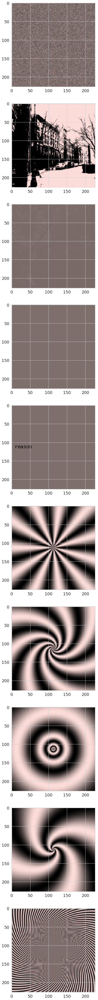

In [62]:
n_examples=10
plt.figure(figsize=(8,8*n_examples))
for k, n in enumerate(np.arange(0, len(image_data), len(image_data)/10)):
    plt.subplot(n_examples,1,k+1)
    plt.imshow(shared_image_downsampled[n].transpose((1,2,0)))

## Resize the subjectwise images, concatenate and save

In [68]:
subjects = np.arange(1,9)
nx = 227
for s in subjects:
    print ("Loading block...")
    image_data_set = h5py.File(synth_root + 'nsdsynthetic_colorstimuli_subj%02d.hdf5'%s, 'r')
    print image_data_set.keys()
    image_data = np.copy(image_data_set['imgBrick'])
    image_data_set.close()
    
    s_image_data = resize_image_tensor(image_data[:,:,323:323+714].transpose(0,3,1,2), newsize=(nx,nx))
    print (image_data.shape, '>', s_image_data.shape, '+', shared_image_downsampled.shape)
    s_image_data = np.concatenate([shared_image_downsampled, s_image_data], axis=0)
    print ('=', s_image_data.shape)
    
    save_stuff("%sS%d_synth_stimuli_%d"%(stim_root, s, nx), {'stimuli': s_image_data})

Loading block...
[u'imgBrick']
((64, 714, 1360, 3), '>', (64, 3, 227, 227), '+', (220, 3, 227, 227))
('=', (284, 3, 227, 227))
saved stimuli in h5py file
Loading block...
[u'imgBrick']
((64, 714, 1360, 3), '>', (64, 3, 227, 227), '+', (220, 3, 227, 227))
('=', (284, 3, 227, 227))
saved stimuli in h5py file
Loading block...
[u'imgBrick']
((64, 714, 1360, 3), '>', (64, 3, 227, 227), '+', (220, 3, 227, 227))
('=', (284, 3, 227, 227))
saved stimuli in h5py file
Loading block...
[u'imgBrick']
((64, 714, 1360, 3), '>', (64, 3, 227, 227), '+', (220, 3, 227, 227))
('=', (284, 3, 227, 227))
saved stimuli in h5py file
Loading block...
[u'imgBrick']
((64, 714, 1360, 3), '>', (64, 3, 227, 227), '+', (220, 3, 227, 227))
('=', (284, 3, 227, 227))
saved stimuli in h5py file
Loading block...
[u'imgBrick']
((64, 714, 1360, 3), '>', (64, 3, 227, 227), '+', (220, 3, 227, 227))
('=', (284, 3, 227, 227))
saved stimuli in h5py file
Loading block...
[u'imgBrick']
((64, 714, 1360, 3), '>', (64, 3, 227, 227), 

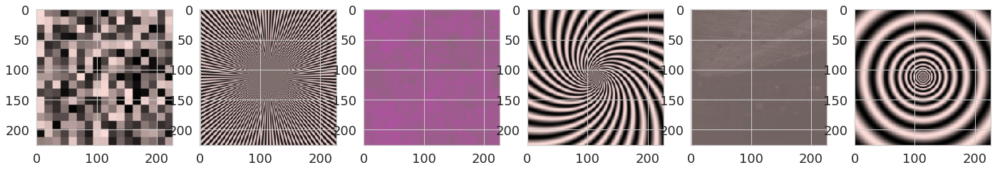

In [70]:
n_examples=6
plt.figure(figsize=(4*n_examples, 4))
for k, n in enumerate(np.random.randint(0,len(s_image_data), n_examples)):
    plt.subplot(1,n_examples,k+1)
    plt.imshow(s_image_data[n].transpose((1,2,0)))

In [72]:
print (s_image_data[n,0,0])
print (np.mean(s_image_data.astype(np.float64), axis=(0,2,3)))

[  6   3   1   0   0   2   3   7  11  16  21  28  35  43  52  61  70  80
  91 101 113 124 135 145 156 166 176 186 195 204 212 219 226 232 237 242
 245 248 250 252 252 251 250 248 245 241 237 232 227 221 214 207 200 192
 185 177 168 160 151 143 134 125 117 108 100  92  85  77  70  64  57  52
  46  41  36  31  27  23  20  16  13  11   9   7   5   4   3   2   1   1
   0   0   0   0   1   1   1   2   3   3   4   4   5   5   6   6   7   7
   7   8   8   8   8   8   8   8   8   8   7   7   7   6   6   5   5   4
   4   3   3   2   1   1   1   0   0   0   0   1   1   2   3   4   5   7
   9  11  13  16  20  23  27  31  36  41  46  52  57  64  70  77  85  92
 100 108 117 125 134 143 151 160 168 177 185 192 200 207 214 221 227 232
 237 241 245 248 250 251 252 252 250 248 245 242 237 232 226 219 212 204
 195 186 176 166 156 145 135 124 113 101  91  80  70  61  52  43  35  28
  21  16  11   7   3   2   0   0   1   3   6]
[120.46679594 105.49482508 103.50336669]


In [27]:
from src.load_nsd import load_betas

subjects = [1]
voxel_data = {}
for k,s in enumerate(subjects):
    print ('--------  subject %d  -------' % s)
    beta_subj = beta_root + "subj%02d/func1pt8mm/nsdsyntheticbetas_fithrf_GLMdenoise_RR/"%s
    voxel_data[s],_ = load_betas(folder_name=beta_subj, zscore=True, voxel_mask=None, up_to=-1)
    print ('----------------------------')
    print (voxel_data[s].shape)

--------  subject 1  -------
/home/styvesg/repo.data/datasets/nsd/nsddata_betas/ppdata/subj01/func1pt8mm/nsdsyntheticbetas_fithrf_GLMdenoise_RR/betas_nsdsynthetic.mat
(dtype('int16'), -32768, 32767, (744, 83, 104, 81))
<beta> = 0.011, <sigma> = 0.132
----------------------------
(744, 699192)


# COCO indices
## Create a block of COCO IDs concordant with the 'subjectim' array 

In [13]:
import pandas as pd
nsd_stiminfo_file = nsd_root + 'nsddata/experiments/nsd/nsd_stim_info_merged.pkl'
stiminfo = pd.read_pickle(nsd_stiminfo_file)

In [14]:
subject_idx  = exp_design['subjectim']
print (subject_idx.shape)

cocoId_arr = np.zeros(shape=subject_idx.shape, dtype=int)
crop_arr   = np.zeros(shape=subject_idx.shape+(4,), dtype=np.float32)
for j in range(len(subject_idx)):
    cocoId = np.array(stiminfo['cocoId'])[stiminfo['subject%d'%(j+1)].astype(bool)]
    nsdId = np.array(stiminfo['nsdId'])[stiminfo['subject%d'%(j+1)].astype(bool)]
    imageId = subject_idx[j]-1
    for i,k in enumerate(imageId):
        cocoId_arr[j,i] = (cocoId[nsdId==k])[0]
        crop_arr[j,i]   = stiminfo['cropBox'][k]

(8, 10000)


## Reload 

In [16]:
local_stim_dir = root_dir + '../../data/nsd/stims/'
coco_dir = root_dir + '../../data/coco/'

In [17]:
coco_info_set = h5py.File(local_stim_dir + 'nsd_to_coco_indice_map.h5py', 'r')
cocoId_arr = np.copy(coco_info_set['cocoId'])
nsdcrop_arr = np.copy(coco_info_set['crop'])
coco_info_set.close()

print (cocoId_arr.shape)
print (nsdcrop_arr.shape)
#
#image_data_set = h5py.File(local_stim_dir + "S%d_stimuli_227.h5py"%subject, 'r')
#image_data = np.copy(image_data_set['stimuli'])
#image_data_set.close()
#
#print (image_data.shape)
#print (image_data.dtype)
#print (np.min(image_data[0]), np.max(image_data[0]))

(8, 10000)
(8, 10000, 4)
(10000, 3, 227, 227)
uint8
0 255


In [74]:
import json
from collections import defaultdict

annDir = coco_dir
imgDir = annDir + 'panoptic_annotations_trainval2017/annotations/panoptic/' # combined folder with train2017 and val2017 png masks
panop_trn_annFile = annDir + 'panoptic_annotations_trainval2017/annotations/panoptic_train2017.json'
panop_val_annFile = annDir + 'panoptic_annotations_trainval2017/annotations/panoptic_val2017.json'

dataset = dict()
dataset = json.load(open(panop_trn_annFile, 'r'))

imgIdToAnns = defaultdict(list)
catIdToCat = defaultdict(list)
if 'annotations' in dataset:
    for ann in dataset['annotations']:
        imgIdToAnns[ann['image_id']].append(ann)
    for cat in dataset['categories']:
        catIdToCat[cat['id']].append(cat)
        
dataset = dict()
dataset = json.load(open(panop_val_annFile, 'r'))

if 'annotations' in dataset:
    for ann in dataset['annotations']:
        imgIdToAnns[ann['image_id']].append(ann)
    for cat in dataset['categories']:
        catIdToCat[cat['id']].append(cat)

650
/export/raid1/home/styvesg/code/nsd_gnet8x/../../data/coco/panoptic_annotations_trainval2017/annotations/panoptic/000000000650.png
[184, 17, 3, 185]
['car' 'cat' 'fence-merged' 'tree-merged']
['animal' 'plant' 'structural' 'vehicle']
1308
/export/raid1/home/styvesg/code/nsd_gnet8x/../../data/coco/panoptic_annotations_trainval2017/annotations/panoptic/000000001308.png
[1, 42, 155, 187]
['person' 'sea' 'sky-other-merged' 'surfboard']
['person' 'sky' 'sports' 'water']
263599
/export/raid1/home/styvesg/code/nsd_gnet8x/../../data/coco/panoptic_annotations_trainval2017/annotations/panoptic/000000263599.png
[5, 187]
['airplane' 'sky-other-merged']
['sky' 'vehicle']
525790
/export/raid1/home/styvesg/code/nsd_gnet8x/../../data/coco/panoptic_annotations_trainval2017/annotations/panoptic/000000525790.png
[1, 155, 42, 187]
['person' 'sea' 'sky-other-merged' 'surfboard']
['person' 'sky' 'sports' 'water']
525932
/export/raid1/home/styvesg/code/nsd_gnet8x/../../data/coco/panoptic_annotations_trai

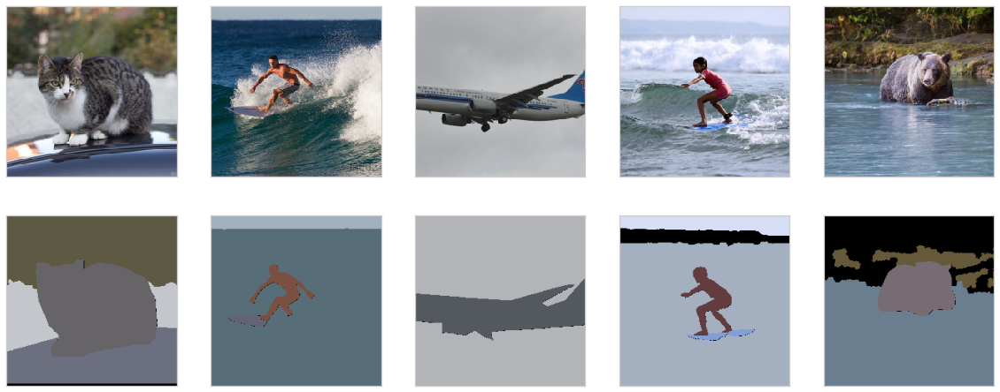

In [20]:
import skimage.io
from skimage.transform import resize

minSize = 227
start_idx = 8
n_idx = 5

plt.figure(figsize=(n_idx*4, 2*4))
for i in range(n_idx):
    nId = start_idx+i
    cId = cocoId_arr[subject-1, nId]
    print (cId)
    png_name = imgDir + '%012d.png' % cId
    print (png_name)
    crop = nsdcrop_arr[subject-1, nId]
    img = skimage.io.imread(png_name)
       
    croppedImg = applyCropToImg(img, crop)  
    croppedImg = closest_neighbor_resize(croppedImg, (minSize, minSize))   
    ##
    plt.subplot(2,n_idx,i+1)
    plt.imshow(image_data[nId].transpose((1,2,0)), cmap='gray', interpolation='None')
    plt.gca().get_xaxis().set_visible(False)
    plt.gca().get_yaxis().set_visible(False)
    ##
    plt.subplot(2,n_idx,n_idx+i+1)
    plt.imshow(croppedImg) 
    plt.gca().get_xaxis().set_visible(False)
    plt.gca().get_yaxis().set_visible(False)
    ###
    imgSegIds = maskToUniqueIndices(croppedImg) # unique segment IDs
    catIds = getCategoryIDs(imgIdToAnns[cId], imgSegIds)
    print (catIds)
    print (getCategoryNames(catIdToCat, catIds))
    print (getSupercategoryNames(catIdToCat, catIds))

In [21]:
stuff_annFile = annDir + 'stuff_annotations_trainval2017/annotations/stuff_train2017.json'
thing_annFile = annDir + 'annotations_trainval2017/annotations/instances_train2017.json'

from pycocotools.coco import COCO
coco_stuff = COCO(stuff_annFile)
coco_thing = COCO(thing_annFile)

loading annotations into memory...
Done (t=10.00s)
creating index...
index created!
loading annotations into memory...
Done (t=12.56s)
creating index...
index created!


In [25]:
# display COCO categories and supercategories
cats = coco_stuff.loadCats(coco_stuff.getCatIds())
stuff_nms=[cat['name'] for cat in cats]
print('COCO stuff categories: \n{}\n'.format(' '.join(stuff_nms)))
super_stuff_nms = list(set([cat['supercategory'] for cat in cats]))
print('COCO stuff supercategories: \n{}'.format(' '.join(set(super_stuff_nms))))

print ()
cats = coco_thing.loadCats(coco_thing.getCatIds())
thing_nms=[cat['name'] for cat in cats]
print('COCO thing categories: \n{}\n'.format(' '.join(thing_nms)))
super_thing_nms = list(set([cat['supercategory'] for cat in cats]))
print('COCO thing supercategories: \n{}'.format(' '.join(set(super_thing_nms))))

print ()
cat_nms   = thing_nms + stuff_nms
super_nms = super_thing_nms + super_stuff_nms
print('COCO supercategories: \n{}'.format(' '.join(set(super_nms))))

COCO stuff categories: 
banner blanket branch bridge building-other bush cabinet cage cardboard carpet ceiling-other ceiling-tile cloth clothes clouds counter cupboard curtain desk-stuff dirt door-stuff fence floor-marble floor-other floor-stone floor-tile floor-wood flower fog food-other fruit furniture-other grass gravel ground-other hill house leaves light mat metal mirror-stuff moss mountain mud napkin net paper pavement pillow plant-other plastic platform playingfield railing railroad river road rock roof rug salad sand sea shelf sky-other skyscraper snow solid-other stairs stone straw structural-other table tent textile-other towel tree vegetable wall-brick wall-concrete wall-other wall-panel wall-stone wall-tile wall-wood water-other waterdrops window-blind window-other wood other

COCO stuff supercategories: 
sky floor food-stuff furniture-stuff ground solid water plant textile window wall ceiling other structural building raw-material

COCO thing categories: 
person bicycle ca

# Basic category embedding

In [174]:
print ('super category count = ', len(super_nms))
sup_label_map, sup_class_embedding = {}, {}
for k,name in enumerate(super_nms):
    sup_label_map[k] = name
    sup_class_embedding[name] = k

super category count =  28


In [237]:
print ('basic category count = ', len(cat_nms))
cat_class_embedding, cat_label_map, cat_id_map = {}, {}, {}
sup_id_map, category_to_supercategory_id_map = {}, {}

for j, (k,c) in enumerate(catIdToCat.items()): 
    cat_class_embedding[c[0]['name']] = j
    cat_label_map[j] = c[0]['name'] 
    cat_id_map[c[0]['id']] = j
    ##
    category_to_supercategory_id_map[ cat_id_map[c[0]['id']]] = sup_class_embedding[ c[0]['supercategory'] ]
    sup_id_map[c[0]['id']] = sup_class_embedding[ c[0]['supercategory'] ]
    ##
    print (bool(c[0]['isthing']), ':', j, ':', c[0]['id'], ':', c[0]['name'], '(', c[0]['supercategory'], ')')

basic category count =  172
True : 0 : 1 : person ( person )
True : 1 : 2 : bicycle ( vehicle )
True : 2 : 3 : car ( vehicle )
True : 3 : 4 : motorcycle ( vehicle )
True : 4 : 5 : airplane ( vehicle )
True : 5 : 6 : bus ( vehicle )
True : 6 : 7 : train ( vehicle )
True : 7 : 8 : truck ( vehicle )
True : 8 : 9 : boat ( vehicle )
True : 9 : 10 : traffic light ( outdoor )
True : 10 : 11 : fire hydrant ( outdoor )
True : 11 : 13 : stop sign ( outdoor )
True : 12 : 14 : parking meter ( outdoor )
True : 13 : 15 : bench ( outdoor )
True : 14 : 16 : bird ( animal )
True : 15 : 17 : cat ( animal )
True : 16 : 18 : dog ( animal )
True : 17 : 19 : horse ( animal )
True : 18 : 20 : sheep ( animal )
True : 19 : 21 : cow ( animal )
True : 20 : 22 : elephant ( animal )
True : 21 : 23 : bear ( animal )
True : 22 : 24 : zebra ( animal )
True : 23 : 25 : giraffe ( animal )
True : 24 : 27 : backpack ( accessory )
True : 25 : 28 : umbrella ( accessory )
True : 26 : 31 : handbag ( accessory )
True : 27 : 3

---
# Category and Supercategory Embedding

In [176]:
cocoMap = np.ones(shape=(73000), dtype=int) * -1
for j in range(len(subject_idx)):
    cocoId = np.array(stiminfo['cocoId'])[stiminfo['subject%d'%(j+1)].astype(bool)]
    nsdId = np.array(stiminfo['nsdId'])[stiminfo['subject%d'%(j+1)].astype(bool)] 
    cocoMap[nsdId] = cocoId
print (np.sum(cocoMap==-1))
print (cocoMap.shape)
print (stiminfo['cropBox'].shape)

0
(73000,)
(73000,)


In [91]:
import skimage.io
from skimage.transform import resize
minSize = 227

imgDir = annDir + 'panoptic_annotations_trainval2017/annotations/panoptic/' # combined folder with train2017 and val2017 png masks

cocoCat = {}
for nId,cId in tqdm(enumerate(cocoMap)):
    png_name = imgDir + '%012d.png' % cId
    crop = stiminfo['cropBox'][nId]
    ##
    img = skimage.io.imread(png_name)
    
    croppedImg = applyCropToImg(img, crop)
    croppedImg = closest_neighbor_resize(croppedImg, (minSize, minSize)) 
    ##
    
    imgSegIds = maskToUniqueIndices(croppedImg) # unique segment IDs
    catIds = getCategoryIDs(imgIdToAnns[cId], imgSegIds)
    ##
    cocoCat[nId] = {}
    cocoCat[nId]['catId'] = np.unique(catIds)
    cocoCat[nId]['catName'] = getCategoryNames(catIdToCat, catIds)
    cocoCat[nId]['supName'] = getSupercategoryNames(catIdToCat, catIds) 

73000it [16:46, 72.55it/s] 


In [177]:
print (cocoCat[0])

{'catId': array([  1,   3,  38,  42, 128, 154, 155, 184, 187]), 'catName': array(['car', 'house', 'kite', 'person', 'sand', 'sea',
       'sky-other-merged', 'surfboard', 'tree-merged'], dtype='<U16'), 'supName': array(['building', 'ground', 'person', 'plant', 'sky', 'sports',
       'vehicle', 'water'], dtype='<U8')}


In [182]:
catEmb = np.zeros(shape=(len(cocoMap), np.max(list(cat_label_map.keys()))+1), dtype=int)
supEmb = np.zeros(shape=(len(cocoMap), np.max(list(sup_label_map.keys()))+1), dtype=int)

for k,vv in cocoCat.items():
    cocoCat[k]['catId'] = np.unique(cocoCat[k]['catId'])
    for v in vv['catName']:
        catEmb[k][cat_class_embedding[v]] = 1
    for v in vv['supName']:
        supEmb[k][sup_class_embedding[v]] = 1        

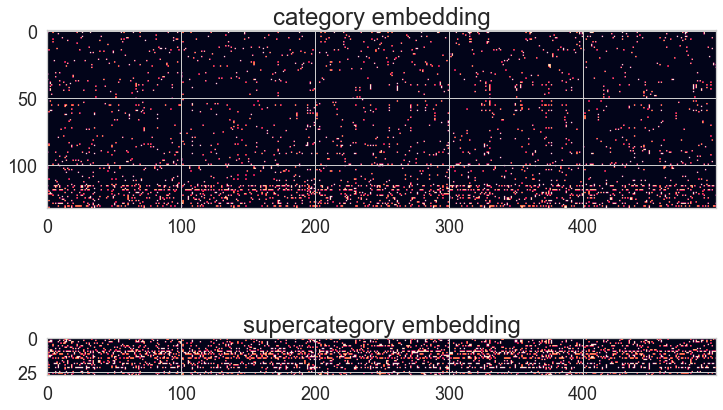

In [185]:
plt.figure(figsize=(12,8))
plt.subplot(2,1,1)
plt.title('category embedding')
plt.imshow(catEmb[:500].T)
plt.subplot(2,1,2)
plt.title('supercategory embedding')
plt.imshow(supEmb[:500].T)

In [186]:
print (stim_dir)

/export/raid1/home/styvesg/code/nsd_gnet8x/../../data/nsd/stims/


In [187]:
from src.file_utility import save_stuff, flatten_dict, embed_dict

label_dict = {
    'category_embedding': catEmb, 
    'supercategory_embedding': supEmb,
    'category_label_map': cat_label_map,
    'supercategory_label_map': sup_label_map,
    'cat_to_sup_id_map': category_to_supercategory_id_map,
    'cocoId': cocoId_arr, 
    'crop': crop_arr, 
    'cocoMap': cocoMap
    }

save_stuff(stim_dir + "embedding_thing_and_stuff_73K", flatten_dict(label_dict))

saved category_embedding in h5py file
saved supercategory_embedding in h5py file
saved category_label_map.0 in h5py file
saved category_label_map.1 in h5py file
saved category_label_map.2 in h5py file
saved category_label_map.3 in h5py file
saved category_label_map.4 in h5py file
saved category_label_map.5 in h5py file
saved category_label_map.6 in h5py file
saved category_label_map.7 in h5py file
saved category_label_map.8 in h5py file
saved category_label_map.9 in h5py file
saved category_label_map.10 in h5py file
saved category_label_map.11 in h5py file
saved category_label_map.12 in h5py file
saved category_label_map.13 in h5py file
saved category_label_map.14 in h5py file
saved category_label_map.15 in h5py file
saved category_label_map.16 in h5py file
saved category_label_map.17 in h5py file
saved category_label_map.18 in h5py file
saved category_label_map.19 in h5py file
saved category_label_map.20 in h5py file
saved category_label_map.21 in h5py file
saved category_label_map.22

---
# Individual subject category and supercategory maps (global index)

In [188]:
def categoryMap(croppedImg, annotations, embbeding):
    segmentMap = maskToIndices(croppedImg).flatten()
    catMap = np.full(fill_value=-1, shape=segmentMap.shape)
    imgSegIds = list(np.unique(segmentMap)) # seg id is unique to any instance
    if 0 in imgSegIds:
        imgSegIds.remove(0)
    catIds = getCategoryIDs(annotations, imgSegIds)
    #print (imgSegIds, '-', catIds)
    for s,c in zip(imgSegIds, catIds):
        mask = segmentMap==s     
        catMap[mask] = embbeding[c]            
    return catMap.reshape(croppedImg.shape[:2])

['bed', 'blanket', 'wall-other-merged']
['bus', 'road', 'tree-merged', 'sky-other-merged', 'pavement-merged', 'building-other-merged']
['bottle', 'cup', 'knife', 'spoon', 'bowl', 'oven', 'sink', 'counter', 'wall-tile', 'cabinet-merged']
['frisbee', 'sand', 'sea', 'sky-other-merged']
['car', 'umbrella', 'road', 'roof', 'wall-brick', 'tree-merged', 'fence-merged', 'sky-other-merged', 'pavement-merged', 'building-other-merged', 'wall-other-merged']


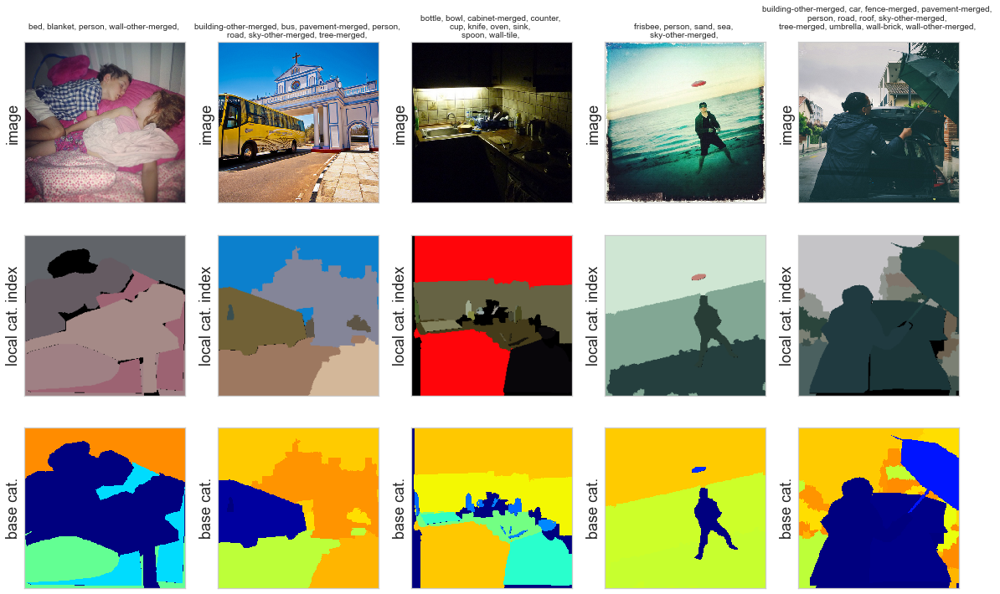

In [196]:
import skimage.io
from skimage.transform import resize
minSize = 227
start_idx = 3938
n_idx = 5

plt.figure(figsize=(n_idx*4, 3*4))
for i in range(n_idx):
    nId = start_idx+i
    cId = cocoMap[nId]
    crop = stiminfo['cropBox'][nId]
    ##
    png_name = imgDir + '%012d.png' % cId
    img = skimage.io.imread(png_name)
    
    croppedImg = applyCropToImg(img, crop)
    croppedImg = closest_neighbor_resize(croppedImg, (minSize, minSize)) 
    croppedSuper = categoryMap(croppedImg, imgIdToAnns[cId], cat_id_map)   
    ################
    
    catIds = getCategoryIDs(imgIdToAnns[cId], maskToUniqueIndices(croppedImg))  
    scatNames = np.unique(getCategoryNames(catIdToCat, catIds))
    
    print ([cat_label_map[c] for c in np.unique(croppedSuper) if c>0])
    ################
    plt.subplot(3,n_idx,i+1)
    header = ''
    for k,s in enumerate(scatNames):
        header += '%s, '%s
        if (k+1)%4==0:
            header += '\n'
    plt.title(header, fontsize=10)  
    plt.ylabel('image')
    plt.imshow(image_data[nId], cmap='gray', interpolation='None')
    plt.gca().get_xaxis().set_visible(False)
    plt.gca().get_yaxis().set_ticks([])
    ###
    plt.subplot(3,n_idx,n_idx+i+1)
    plt.imshow(croppedImg)
    plt.ylabel('local cat. index')
    plt.gca().get_xaxis().set_visible(False)
    plt.gca().get_yaxis().set_ticks([])
    ###
    plt.subplot(3,n_idx,2*n_idx+i+1)
    plt.ylabel('base cat.')
    plt.imshow(croppedSuper, cmap='jet', vmin=0, vmax=len(cat_nms), interpolation='None')
    #plt.colorbar()
    plt.gca().get_xaxis().set_visible(False)
    plt.gca().get_yaxis().set_ticks([])

# Category label maps for all subjects
This takes a long time since we need to load the image and annotations one-by-one and reinterpret them. 

In [193]:
print (cat_label_map)

{0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut', 55: 'cake', 56: 'chair', 57: 'couch', 58: 'potted plant', 59: 'bed', 60: 'dining table', 61: 'toilet', 62: 'tv', 63: 'laptop', 64: 'mouse', 65: 'remote', 66: 'keyboard', 67: 'cell phone', 68: 'microw

In [99]:
nx = 227
nc = np.max(list(cat_label_map.keys()))+1

for k in range(len(cocoId_arr)): # for all subjects
    l_image_data = np.zeros(shape=(len(cocoId_arr[k]), nx, nx), dtype=np.uint8)

    for i, (cId, crop) in tqdm(enumerate(zip(cocoId_arr[k], nsdcrop_arr[k]))):
        png_name = imgDir + '%012d.png' % cId
        img = skimage.io.imread(png_name)

        croppedImg = applyCropToImg(img, crop)
        croppedImg = closest_neighbor_resize(croppedImg, (minSize, minSize))
        l_image_data[i,...] = categoryMap(croppedImg, imgIdToAnns[cId], cat_id_map)
        
    print (l_image_data.shape)
    save_stuff("%sS%d_category_%d"%(stim_dir, k+1, nx), flatten_dict({'labels': l_image_data, 'label_map': cat_label_map, \
                                                                      'label_count': nc, 'cat_to_sup_idmap': category_to_supercategory_id_map}))

10000it [01:06, 150.68it/s]


(10000, 227, 227)
saved labels in h5py file
saved label_map.0 in h5py file
saved label_map.1 in h5py file
saved label_map.2 in h5py file
saved label_map.3 in h5py file
saved label_map.4 in h5py file
saved label_map.5 in h5py file
saved label_map.6 in h5py file
saved label_map.7 in h5py file
saved label_map.8 in h5py file
saved label_map.9 in h5py file
saved label_map.10 in h5py file
saved label_map.11 in h5py file
saved label_map.12 in h5py file
saved label_map.13 in h5py file
saved label_map.14 in h5py file
saved label_map.15 in h5py file
saved label_map.16 in h5py file
saved label_map.17 in h5py file
saved label_map.18 in h5py file
saved label_map.19 in h5py file
saved label_map.20 in h5py file
saved label_map.21 in h5py file
saved label_map.22 in h5py file
saved label_map.23 in h5py file
saved label_map.24 in h5py file
saved label_map.25 in h5py file
saved label_map.26 in h5py file
saved label_map.27 in h5py file
saved label_map.28 in h5py file
saved label_map.29 in h5py file
saved 

10000it [01:06, 150.97it/s]


(10000, 227, 227)
saved labels in h5py file
saved label_map.0 in h5py file
saved label_map.1 in h5py file
saved label_map.2 in h5py file
saved label_map.3 in h5py file
saved label_map.4 in h5py file
saved label_map.5 in h5py file
saved label_map.6 in h5py file
saved label_map.7 in h5py file
saved label_map.8 in h5py file
saved label_map.9 in h5py file
saved label_map.10 in h5py file
saved label_map.11 in h5py file
saved label_map.12 in h5py file
saved label_map.13 in h5py file
saved label_map.14 in h5py file
saved label_map.15 in h5py file
saved label_map.16 in h5py file
saved label_map.17 in h5py file
saved label_map.18 in h5py file
saved label_map.19 in h5py file
saved label_map.20 in h5py file
saved label_map.21 in h5py file
saved label_map.22 in h5py file
saved label_map.23 in h5py file
saved label_map.24 in h5py file
saved label_map.25 in h5py file
saved label_map.26 in h5py file
saved label_map.27 in h5py file
saved label_map.28 in h5py file
saved label_map.29 in h5py file
saved 

10000it [01:06, 150.42it/s]


(10000, 227, 227)
saved labels in h5py file
saved label_map.0 in h5py file
saved label_map.1 in h5py file
saved label_map.2 in h5py file
saved label_map.3 in h5py file
saved label_map.4 in h5py file
saved label_map.5 in h5py file
saved label_map.6 in h5py file
saved label_map.7 in h5py file
saved label_map.8 in h5py file
saved label_map.9 in h5py file
saved label_map.10 in h5py file
saved label_map.11 in h5py file
saved label_map.12 in h5py file
saved label_map.13 in h5py file
saved label_map.14 in h5py file
saved label_map.15 in h5py file
saved label_map.16 in h5py file
saved label_map.17 in h5py file
saved label_map.18 in h5py file
saved label_map.19 in h5py file
saved label_map.20 in h5py file
saved label_map.21 in h5py file
saved label_map.22 in h5py file
saved label_map.23 in h5py file
saved label_map.24 in h5py file
saved label_map.25 in h5py file
saved label_map.26 in h5py file
saved label_map.27 in h5py file
saved label_map.28 in h5py file
saved label_map.29 in h5py file
saved 

10000it [01:06, 150.46it/s]


(10000, 227, 227)
saved labels in h5py file
saved label_map.0 in h5py file
saved label_map.1 in h5py file
saved label_map.2 in h5py file
saved label_map.3 in h5py file
saved label_map.4 in h5py file
saved label_map.5 in h5py file
saved label_map.6 in h5py file
saved label_map.7 in h5py file
saved label_map.8 in h5py file
saved label_map.9 in h5py file
saved label_map.10 in h5py file
saved label_map.11 in h5py file
saved label_map.12 in h5py file
saved label_map.13 in h5py file
saved label_map.14 in h5py file
saved label_map.15 in h5py file
saved label_map.16 in h5py file
saved label_map.17 in h5py file
saved label_map.18 in h5py file
saved label_map.19 in h5py file
saved label_map.20 in h5py file
saved label_map.21 in h5py file
saved label_map.22 in h5py file
saved label_map.23 in h5py file
saved label_map.24 in h5py file
saved label_map.25 in h5py file
saved label_map.26 in h5py file
saved label_map.27 in h5py file
saved label_map.28 in h5py file
saved label_map.29 in h5py file
saved 

10000it [01:06, 151.14it/s]


(10000, 227, 227)
saved labels in h5py file
saved label_map.0 in h5py file
saved label_map.1 in h5py file
saved label_map.2 in h5py file
saved label_map.3 in h5py file
saved label_map.4 in h5py file
saved label_map.5 in h5py file
saved label_map.6 in h5py file
saved label_map.7 in h5py file
saved label_map.8 in h5py file
saved label_map.9 in h5py file
saved label_map.10 in h5py file
saved label_map.11 in h5py file
saved label_map.12 in h5py file
saved label_map.13 in h5py file
saved label_map.14 in h5py file
saved label_map.15 in h5py file
saved label_map.16 in h5py file
saved label_map.17 in h5py file
saved label_map.18 in h5py file
saved label_map.19 in h5py file
saved label_map.20 in h5py file
saved label_map.21 in h5py file
saved label_map.22 in h5py file
saved label_map.23 in h5py file
saved label_map.24 in h5py file
saved label_map.25 in h5py file
saved label_map.26 in h5py file
saved label_map.27 in h5py file
saved label_map.28 in h5py file
saved label_map.29 in h5py file
saved 

10000it [01:06, 150.81it/s]


(10000, 227, 227)
saved labels in h5py file
saved label_map.0 in h5py file
saved label_map.1 in h5py file
saved label_map.2 in h5py file
saved label_map.3 in h5py file
saved label_map.4 in h5py file
saved label_map.5 in h5py file
saved label_map.6 in h5py file
saved label_map.7 in h5py file
saved label_map.8 in h5py file
saved label_map.9 in h5py file
saved label_map.10 in h5py file
saved label_map.11 in h5py file
saved label_map.12 in h5py file
saved label_map.13 in h5py file
saved label_map.14 in h5py file
saved label_map.15 in h5py file
saved label_map.16 in h5py file
saved label_map.17 in h5py file
saved label_map.18 in h5py file
saved label_map.19 in h5py file
saved label_map.20 in h5py file
saved label_map.21 in h5py file
saved label_map.22 in h5py file
saved label_map.23 in h5py file
saved label_map.24 in h5py file
saved label_map.25 in h5py file
saved label_map.26 in h5py file
saved label_map.27 in h5py file
saved label_map.28 in h5py file
saved label_map.29 in h5py file
saved 

10000it [01:06, 150.49it/s]


(10000, 227, 227)
saved labels in h5py file
saved label_map.0 in h5py file
saved label_map.1 in h5py file
saved label_map.2 in h5py file
saved label_map.3 in h5py file
saved label_map.4 in h5py file
saved label_map.5 in h5py file
saved label_map.6 in h5py file
saved label_map.7 in h5py file
saved label_map.8 in h5py file
saved label_map.9 in h5py file
saved label_map.10 in h5py file
saved label_map.11 in h5py file
saved label_map.12 in h5py file
saved label_map.13 in h5py file
saved label_map.14 in h5py file
saved label_map.15 in h5py file
saved label_map.16 in h5py file
saved label_map.17 in h5py file
saved label_map.18 in h5py file
saved label_map.19 in h5py file
saved label_map.20 in h5py file
saved label_map.21 in h5py file
saved label_map.22 in h5py file
saved label_map.23 in h5py file
saved label_map.24 in h5py file
saved label_map.25 in h5py file
saved label_map.26 in h5py file
saved label_map.27 in h5py file
saved label_map.28 in h5py file
saved label_map.29 in h5py file
saved 

10000it [01:05, 151.58it/s]


(10000, 227, 227)
saved labels in h5py file
saved label_map.0 in h5py file
saved label_map.1 in h5py file
saved label_map.2 in h5py file
saved label_map.3 in h5py file
saved label_map.4 in h5py file
saved label_map.5 in h5py file
saved label_map.6 in h5py file
saved label_map.7 in h5py file
saved label_map.8 in h5py file
saved label_map.9 in h5py file
saved label_map.10 in h5py file
saved label_map.11 in h5py file
saved label_map.12 in h5py file
saved label_map.13 in h5py file
saved label_map.14 in h5py file
saved label_map.15 in h5py file
saved label_map.16 in h5py file
saved label_map.17 in h5py file
saved label_map.18 in h5py file
saved label_map.19 in h5py file
saved label_map.20 in h5py file
saved label_map.21 in h5py file
saved label_map.22 in h5py file
saved label_map.23 in h5py file
saved label_map.24 in h5py file
saved label_map.25 in h5py file
saved label_map.26 in h5py file
saved label_map.27 in h5py file
saved label_map.28 in h5py file
saved label_map.29 in h5py file
saved 

---
# Supercategory embedding

['furniture', 'person']
['outdoor', 'building']
['furniture', 'animal', 'floor', 'textile', 'wall']
['kitchen', 'furniture', 'food', 'person', 'floor', 'food-stuff', 'textile']
['furniture', 'electronic', 'furniture-stuff', 'food-stuff']


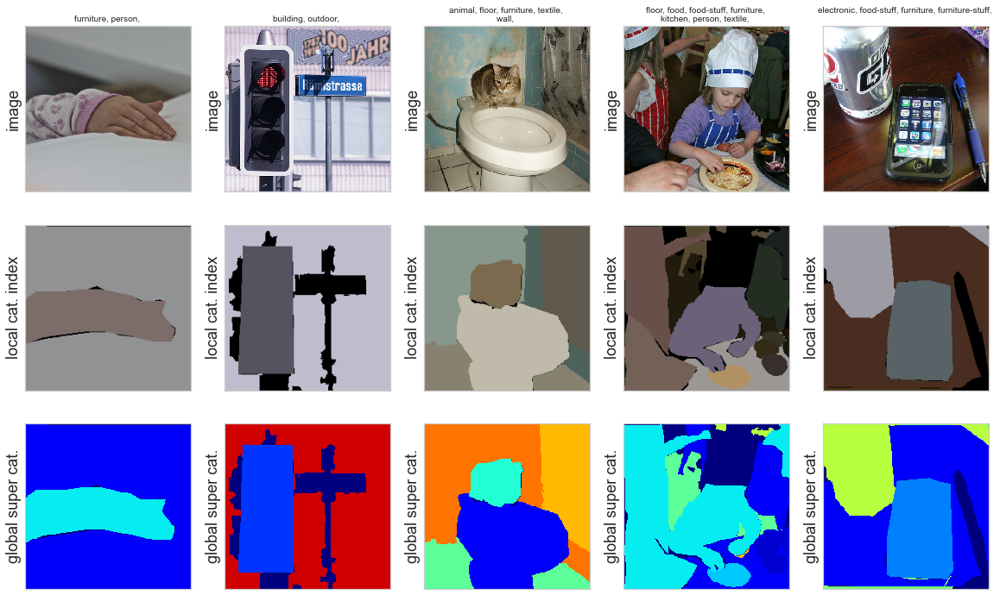

In [238]:
import skimage.io
from skimage.transform import resize
minSize = 227
start_idx = 1222
n_idx = 5

plt.figure(figsize=(n_idx*4, 3*4))
for i in range(n_idx):
    nId = start_idx+i
    cId = cocoMap[nId]
    crop = stiminfo['cropBox'][nId]
    
    png_name = imgDir + '%012d.png' % cId
    img = skimage.io.imread(png_name)
    
    croppedImg = applyCropToImg(img,crop)
    croppedImg = closest_neighbor_resize(croppedImg, (minSize, minSize)) 
    croppedSuper = categoryMap(croppedImg, imgIdToAnns[cId], sup_id_map)   
    ################
    
    catIds = getCategoryIDs(imgIdToAnns[cId], maskToUniqueIndices(croppedImg))  
    scatNames = np.unique(getSupercategoryNames(catIdToCat, catIds))
    
    print ([sup_label_map[c] for c in np.unique(croppedSuper) if c>0])
    ################
    plt.subplot(3,n_idx,i+1)
    header = ''
    for k,s in enumerate(scatNames):
        header += '%s, '%s
        if (k+1)%4==0:
            header += '\n'
    plt.title(header, fontsize=10)  
    plt.ylabel('image')
    plt.imshow(image_data[nId], cmap='gray', interpolation='None')
    plt.gca().get_xaxis().set_visible(False)
    plt.gca().get_yaxis().set_ticks([])
    ###
    plt.subplot(3,n_idx,n_idx+i+1)
    plt.imshow(croppedImg)
    plt.ylabel('local cat. index')
    plt.gca().get_xaxis().set_visible(False)
    plt.gca().get_yaxis().set_ticks([])
    ###
    plt.subplot(3,n_idx,2*n_idx+i+1)
    plt.ylabel('global super cat.')
    plt.imshow(croppedSuper, cmap='jet', vmin=0, vmax=len(super_nms), interpolation='None')
    #plt.colorbar()
    plt.gca().get_xaxis().set_visible(False)
    plt.gca().get_yaxis().set_ticks([])

---

# Label maps for all subjects
This takes a long time since we need to load the image and annotations one-by-one and reinterpret them. 

In [239]:
print (sup_label_map)

{0: 'appliance', 1: 'accessory', 2: 'kitchen', 3: 'furniture', 4: 'indoor', 5: 'outdoor', 6: 'vehicle', 7: 'electronic', 8: 'sports', 9: 'food', 10: 'person', 11: 'animal', 12: 'sky', 13: 'floor', 14: 'furniture-stuff', 15: 'ground', 16: 'food-stuff', 17: 'solid', 18: 'water', 19: 'plant', 20: 'textile', 21: 'window', 22: 'wall', 23: 'ceiling', 24: 'other', 25: 'structural', 26: 'building', 27: 'raw-material'}


In [240]:
nx = 227
nc = len(super_nms)

for k in range(len(cocoId_arr)): # for all subjects
    l_image_data = np.zeros(shape=(len(cocoId_arr[k]), nx, nx), dtype=np.uint8)

    for i, (cId, crop) in tqdm(enumerate(zip(cocoId_arr[k], nsdcrop_arr[k]))):
        png_name = imgDir + '%012d.png' % cId
        img = skimage.io.imread(png_name)

        croppedImg = applyCropToImg(img, crop)
        croppedImg = closest_neighbor_resize(croppedImg, (minSize, minSize))
        l_image_data[i,...] = categoryMap(croppedImg, imgIdToAnns[cId], sup_id_map)
        
    print (l_image_data.shape)
    save_stuff("%sS%d_supercategory_%d"%(stim_dir, k+1, nx), flatten_dict({'labels': l_image_data, 'label_map': sup_label_map, 'label_count': nc}))

10000it [01:06, 150.22it/s]


(10000, 227, 227)
saved labels in h5py file
saved label_map.0 in h5py file
saved label_map.1 in h5py file
saved label_map.2 in h5py file
saved label_map.3 in h5py file
saved label_map.4 in h5py file
saved label_map.5 in h5py file
saved label_map.6 in h5py file
saved label_map.7 in h5py file
saved label_map.8 in h5py file
saved label_map.9 in h5py file
saved label_map.10 in h5py file
saved label_map.11 in h5py file
saved label_map.12 in h5py file
saved label_map.13 in h5py file
saved label_map.14 in h5py file
saved label_map.15 in h5py file
saved label_map.16 in h5py file
saved label_map.17 in h5py file
saved label_map.18 in h5py file
saved label_map.19 in h5py file
saved label_map.20 in h5py file
saved label_map.21 in h5py file
saved label_map.22 in h5py file
saved label_map.23 in h5py file
saved label_map.24 in h5py file
saved label_map.25 in h5py file
saved label_map.26 in h5py file
saved label_map.27 in h5py file
saved label_count in h5py file


10000it [01:05, 152.55it/s]


(10000, 227, 227)
saved labels in h5py file
saved label_map.0 in h5py file
saved label_map.1 in h5py file
saved label_map.2 in h5py file
saved label_map.3 in h5py file
saved label_map.4 in h5py file
saved label_map.5 in h5py file
saved label_map.6 in h5py file
saved label_map.7 in h5py file
saved label_map.8 in h5py file
saved label_map.9 in h5py file
saved label_map.10 in h5py file
saved label_map.11 in h5py file
saved label_map.12 in h5py file
saved label_map.13 in h5py file
saved label_map.14 in h5py file
saved label_map.15 in h5py file
saved label_map.16 in h5py file
saved label_map.17 in h5py file
saved label_map.18 in h5py file
saved label_map.19 in h5py file
saved label_map.20 in h5py file
saved label_map.21 in h5py file
saved label_map.22 in h5py file
saved label_map.23 in h5py file
saved label_map.24 in h5py file
saved label_map.25 in h5py file
saved label_map.26 in h5py file
saved label_map.27 in h5py file
saved label_count in h5py file


10000it [01:06, 151.43it/s]


(10000, 227, 227)
saved labels in h5py file
saved label_map.0 in h5py file
saved label_map.1 in h5py file
saved label_map.2 in h5py file
saved label_map.3 in h5py file
saved label_map.4 in h5py file
saved label_map.5 in h5py file
saved label_map.6 in h5py file
saved label_map.7 in h5py file
saved label_map.8 in h5py file
saved label_map.9 in h5py file
saved label_map.10 in h5py file
saved label_map.11 in h5py file
saved label_map.12 in h5py file
saved label_map.13 in h5py file
saved label_map.14 in h5py file
saved label_map.15 in h5py file
saved label_map.16 in h5py file
saved label_map.17 in h5py file
saved label_map.18 in h5py file
saved label_map.19 in h5py file
saved label_map.20 in h5py file
saved label_map.21 in h5py file
saved label_map.22 in h5py file
saved label_map.23 in h5py file
saved label_map.24 in h5py file
saved label_map.25 in h5py file
saved label_map.26 in h5py file
saved label_map.27 in h5py file
saved label_count in h5py file


10000it [01:06, 151.23it/s]


(10000, 227, 227)
saved labels in h5py file
saved label_map.0 in h5py file
saved label_map.1 in h5py file
saved label_map.2 in h5py file
saved label_map.3 in h5py file
saved label_map.4 in h5py file
saved label_map.5 in h5py file
saved label_map.6 in h5py file
saved label_map.7 in h5py file
saved label_map.8 in h5py file
saved label_map.9 in h5py file
saved label_map.10 in h5py file
saved label_map.11 in h5py file
saved label_map.12 in h5py file
saved label_map.13 in h5py file
saved label_map.14 in h5py file
saved label_map.15 in h5py file
saved label_map.16 in h5py file
saved label_map.17 in h5py file
saved label_map.18 in h5py file
saved label_map.19 in h5py file
saved label_map.20 in h5py file
saved label_map.21 in h5py file
saved label_map.22 in h5py file
saved label_map.23 in h5py file
saved label_map.24 in h5py file
saved label_map.25 in h5py file
saved label_map.26 in h5py file
saved label_map.27 in h5py file
saved label_count in h5py file


10000it [01:05, 151.78it/s]


(10000, 227, 227)
saved labels in h5py file
saved label_map.0 in h5py file
saved label_map.1 in h5py file
saved label_map.2 in h5py file
saved label_map.3 in h5py file
saved label_map.4 in h5py file
saved label_map.5 in h5py file
saved label_map.6 in h5py file
saved label_map.7 in h5py file
saved label_map.8 in h5py file
saved label_map.9 in h5py file
saved label_map.10 in h5py file
saved label_map.11 in h5py file
saved label_map.12 in h5py file
saved label_map.13 in h5py file
saved label_map.14 in h5py file
saved label_map.15 in h5py file
saved label_map.16 in h5py file
saved label_map.17 in h5py file
saved label_map.18 in h5py file
saved label_map.19 in h5py file
saved label_map.20 in h5py file
saved label_map.21 in h5py file
saved label_map.22 in h5py file
saved label_map.23 in h5py file
saved label_map.24 in h5py file
saved label_map.25 in h5py file
saved label_map.26 in h5py file
saved label_map.27 in h5py file
saved label_count in h5py file


10000it [01:05, 151.70it/s]


(10000, 227, 227)
saved labels in h5py file
saved label_map.0 in h5py file
saved label_map.1 in h5py file
saved label_map.2 in h5py file
saved label_map.3 in h5py file
saved label_map.4 in h5py file
saved label_map.5 in h5py file
saved label_map.6 in h5py file
saved label_map.7 in h5py file
saved label_map.8 in h5py file
saved label_map.9 in h5py file
saved label_map.10 in h5py file
saved label_map.11 in h5py file
saved label_map.12 in h5py file
saved label_map.13 in h5py file
saved label_map.14 in h5py file
saved label_map.15 in h5py file
saved label_map.16 in h5py file
saved label_map.17 in h5py file
saved label_map.18 in h5py file
saved label_map.19 in h5py file
saved label_map.20 in h5py file
saved label_map.21 in h5py file
saved label_map.22 in h5py file
saved label_map.23 in h5py file
saved label_map.24 in h5py file
saved label_map.25 in h5py file
saved label_map.26 in h5py file
saved label_map.27 in h5py file
saved label_count in h5py file


10000it [01:05, 152.05it/s]


(10000, 227, 227)
saved labels in h5py file
saved label_map.0 in h5py file
saved label_map.1 in h5py file
saved label_map.2 in h5py file
saved label_map.3 in h5py file
saved label_map.4 in h5py file
saved label_map.5 in h5py file
saved label_map.6 in h5py file
saved label_map.7 in h5py file
saved label_map.8 in h5py file
saved label_map.9 in h5py file
saved label_map.10 in h5py file
saved label_map.11 in h5py file
saved label_map.12 in h5py file
saved label_map.13 in h5py file
saved label_map.14 in h5py file
saved label_map.15 in h5py file
saved label_map.16 in h5py file
saved label_map.17 in h5py file
saved label_map.18 in h5py file
saved label_map.19 in h5py file
saved label_map.20 in h5py file
saved label_map.21 in h5py file
saved label_map.22 in h5py file
saved label_map.23 in h5py file
saved label_map.24 in h5py file
saved label_map.25 in h5py file
saved label_map.26 in h5py file
saved label_map.27 in h5py file
saved label_count in h5py file


10000it [01:05, 151.54it/s]


(10000, 227, 227)
saved labels in h5py file
saved label_map.0 in h5py file
saved label_map.1 in h5py file
saved label_map.2 in h5py file
saved label_map.3 in h5py file
saved label_map.4 in h5py file
saved label_map.5 in h5py file
saved label_map.6 in h5py file
saved label_map.7 in h5py file
saved label_map.8 in h5py file
saved label_map.9 in h5py file
saved label_map.10 in h5py file
saved label_map.11 in h5py file
saved label_map.12 in h5py file
saved label_map.13 in h5py file
saved label_map.14 in h5py file
saved label_map.15 in h5py file
saved label_map.16 in h5py file
saved label_map.17 in h5py file
saved label_map.18 in h5py file
saved label_map.19 in h5py file
saved label_map.20 in h5py file
saved label_map.21 in h5py file
saved label_map.22 in h5py file
saved label_map.23 in h5py file
saved label_map.24 in h5py file
saved label_map.25 in h5py file
saved label_map.26 in h5py file
saved label_map.27 in h5py file
saved label_count in h5py file


---
# Multilabel descriptor clustering (classify image into exclusive scene categories)

In [127]:
print (catEmb.shape)

(73000, 133)


In [224]:
from sklearn.manifold import TSNE

embedding = TSNE(n_components=2, n_jobs=4)
label_emb2d = embedding.fit_transform(catEmb[:,:80])

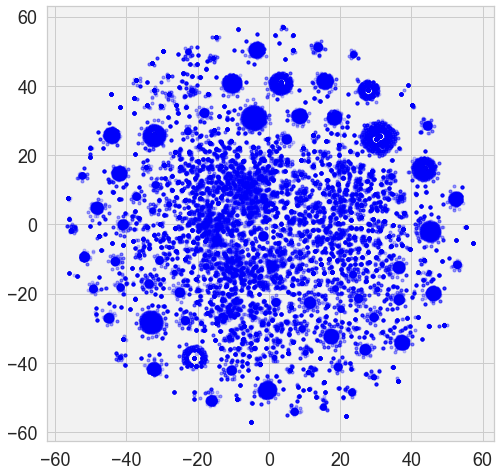

In [225]:
X = label_emb2d
plt.figure(figsize=(8,8))
plt.plot(X[:,0], X[:,1], marker='.', linestyle='None', color='b', alpha=.2)

In [243]:
from scipy.cluster.vq import vq, kmeans2, whiten

wX = whiten(X)
centroids, centroid_labels = kmeans2(wX, k=120)
# Plot whitened data and cluster centers in red
print (centroids.shape, centroid_labels.shape)

(120, 2) (73000,)


In [244]:
centroid_size = np.array([np.sum(centroid_labels==k) for k in range(len(centroids))])
centroid_order = np.argsort(centroid_size)[::-1]

In [245]:
for k in centroid_order[:10]:
    print (k, np.sum(centroid_labels==k)) #[v.round(1) for v in centroids[k]])

57 2038
56 1982
71 1579
25 1563
113 1459
37 1323
63 1262
32 1194
44 1177
51 1106


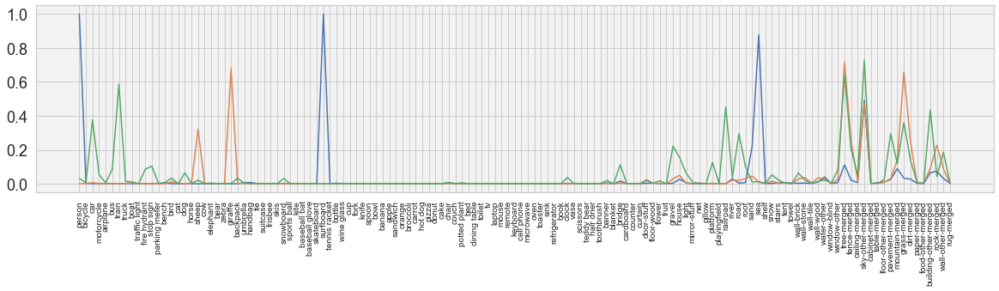

In [246]:
plt.figure(figsize=(20,4))
for k in centroid_order[:3]:
    L = np.mean(catEmb[centroid_labels==k].astype(np.float32), axis=0)
    plt.plot(L)
_=plt.gca().set_xticks(np.arange(len(L)))
_=plt.gca().set_xticklabels([label_map[k] for k in range(len(L))], fontsize=10, rotation=90)

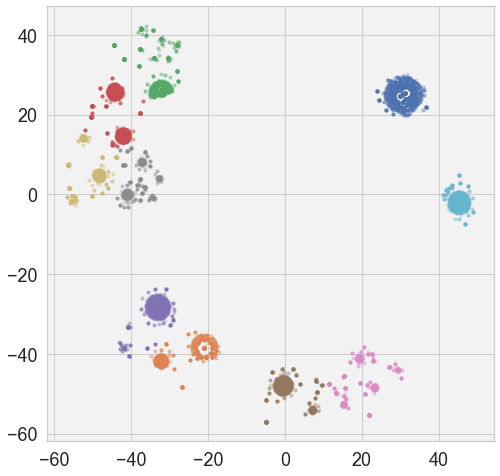

In [247]:
plt.figure(figsize=(8,8))
for k in centroid_order[:10]:
    m = centroid_labels==k
    plt.plot(X[m,0], X[m,1], marker='.', linestyle='None', alpha=.2)

## Example image from each cluster

In [248]:
print (image_data.shape)

(73000, 425, 425, 3)


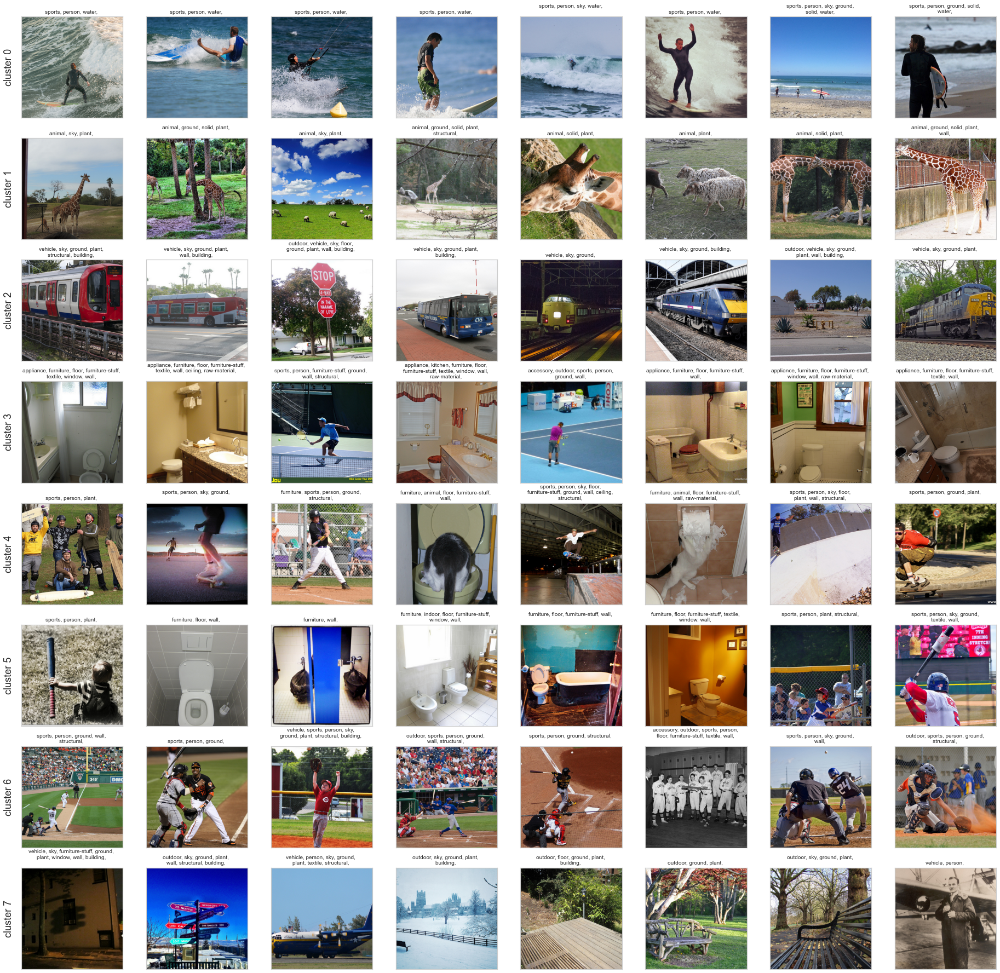

In [249]:
n_img = 8
K = 8

fig=plt.figure(figsize=(4*n_img,  4*K))
for l,k in enumerate(centroid_order[:K]):
    
    m = centroid_labels==k
    idx = np.arange(len(image_data))[m]
    np.random.shuffle(idx)    
    
    for j,i in enumerate(idx[:n_img]):
        plt.subplot(K, n_img, l*n_img+j+1)
        plt.imshow(image_data[i])
        plt.grid(False)
        plt.gca().set_xticklabels([])
        plt.gca().set_yticklabels([])
        if j==0:
            plt.ylabel('cluster %d'%l)
            
        ################
        scatNames = [sup_label_map[k] for k in np.arange(len(sup_label_map))[supEmb[i].astype(bool)]]
        header = ''
        for k,s in enumerate(scatNames):
            header += '%s, '%s
            if (k+1)%4==0:
                header += '\n'
        plt.title(header, fontsize=10)  